# Title

### Adela Sobotkova [![orcid](https://orcid.org/sites/default/files/images/orcid_16x16.png)](https://orcid.org/0000-0002-4541-3963) 
Aarhus University

### Rosanna Farbøl [![orcid](https://orcid.org/sites/default/files/images/orcid_16x16.png)](https://orcid.org/0000-0002-5186-4701) 
Aarhus University/University of Oslo

### Aiswarya Roy [![orcid](https://orcid.org/sites/default/files/images/orcid_16x16.png)](https://orcid.org/0009-0009-7352-9291) 
Aarhus University

[![cc-by](https://licensebuttons.net/l/by/4.0/88x31.png)](https://creativecommons.org/licenses/by/4.0/) 
©<AUTHOR or ORGANIZATION / FUNDER>. Published by De Gruyter in cooperation with the University of Luxembourg Centre for Contemporary and Digital History. This is an Open Access article distributed under the terms of the [Creative Commons Attribution License CC-BY](https://creativecommons.org/licenses/by/4.0/)


[![cc-by-nc-nd](https://licensebuttons.net/l/by-nc-nd/4.0/88x31.png)](https://creativecommons.org/licenses/by-nc-nd/4.0/) 
©<AUTHOR or ORGANIZATION / FUNDER>. Published by De Gruyter in cooperation with the University of Luxembourg Centre for Contemporary and Digital History. This is an Open Access article distributed under the terms of the [Creative Commons Attribution License CC-BY-NC-ND](https://creativecommons.org/licenses/by-nc-nd/4.0/)


 (optional) This article was orginally published (...)

FirstKeyword, SecondKeyword, AlwaysSeparatedByAComma

This is an abstract (...)

## Introduction

This is the first paragrah of running text. 

This is a hermeneutic paragraph

In [1]:
# Check your Python version
from platform import python_version
python_version()

#!python -V

'3.11.9'

In [2]:
## LOADING IN DATA

import geopandas as gpd
import pandas as pd
import pyarrow.parquet as pq

# ==== CORE DATA ====

# Aarhus Network
network_edges_geo = gpd.read_file('script/network_edges.geojson')
network_nodes_geo = gpd.read_file('script/network_nodes.geojson')
print(f"✓ Network edges (geometry): {network_edges_geo.shape[0]:,} features")
print(f"✓ Network nodes (geometry): {network_nodes_geo.shape[0]:,} features")

# Buildings
buildings = gpd.read_file('script/buildings.gpkg')
print(f"✓ Buildings data loaded: {buildings.shape}")

# ==== MUNICIPAL BOUNDARIES ====

aarhus = gpd.read_file('script/aarhus_mun.geojson')
print(f"✓ Aarhus boundary loaded: {aarhus.shape[0]} polygon(s)")

aarhus_city1952 = gpd.read_file('script/aarhus_city1952.gpkg')
print(f"✓ Aarhus 1952 boundary loaded: {aarhus_city1952.shape[0]} polygon(s)")

# ==== Combined Shelters Dataset ====

shelters = gpd.read_file('script/shelters.gpkg')
shelters['shelterID'] = pd.to_numeric(shelters['shelterID'], errors='coerce')

print(f"✓ Shelters (combined KOB, BDG, SR) data loaded: {shelters.shape}")

# ==== BUILDING-SHELTER PAIR DATA ====

building_shelter_pairs = pd.read_csv('script/building_shelter_pairs.csv')
buildings_from_pairs = gpd.read_file('script/buildings_from_pairs.gpkg') # load geom

## Maintain original column name
if 'geometry' in buildings_from_pairs.columns and 'byg404Koordinat' not in buildings_from_pairs.columns:
    buildings_from_pairs = buildings_from_pairs.rename(columns={'geometry': 'byg404Koordinat'})

## Merge Geometry ('byg404Koordinat')
building_shelter_pairs = building_shelter_pairs.merge(buildings_from_pairs, on='id_lokalId', how='left')

print(f"✓ Building-shelter pairs loaded: {building_shelter_pairs.shape[0]:,} records")

# ==== COORDINATE SYSTEM TRANSFORMATION ====

## Transform everything to the same geodetic CRS for mapping / plotting
crs = 'EPSG:4326'

#shelters_proj = shelters.to_crs(crs)
buildings_proj = buildings.to_crs(crs)
aarhus_proj = aarhus_city1952.to_crs(crs)

✓ Network edges (geometry): 39,441 features
✓ Network nodes (geometry): 29,580 features
✓ Buildings data loaded: (19354, 8)
✓ Aarhus boundary loaded: 1 polygon(s)
✓ Aarhus 1952 boundary loaded: 2 polygon(s)
✓ Shelters (combined KOB, BDG, SR) data loaded: (387, 5)
✓ Building-shelter pairs loaded: 2,440,049 records


## Selected Shelter (Map View)

In [3]:
import folium
from folium import plugins
import numpy as np

# ==== SETUP ====

# Set specific shelter to display on map
shelter_id = 1617

# Get the specific shelter
specific_shelter = shelters[shelters['shelterID'] == shelter_id]

# Center map on specific shelter
shelter_coords = [specific_shelter.geometry.y.iloc[0], specific_shelter.geometry.x.iloc[0]]

# ==== CONSTRUCT MAP ====

# Create base map
specific_shelter_map = folium.Map(
    location=shelter_coords, 
    zoom_start=14,
    control_scale=True
)

# Add different layers for map viewing options
folium.TileLayer('OpenStreetMap').add_to(specific_shelter_map)
folium.TileLayer('CartoDB dark_matter', name = 'CartoDB Dark').add_to(specific_shelter_map)
folium.TileLayer('CartoDB positron', name = 'CartoDB Light').add_to(specific_shelter_map)

# Create feature groups for layer control
shelter_layer = folium.FeatureGroup(name='Selected Shelter', show=True)
nearby_shelters_layer = folium.FeatureGroup(name='Nearby Shelters', show=True)

# Add the selected shelter as orange marker
folium.CircleMarker(
    location=shelter_coords,
    radius=12,
    color='darkorange',
    fill=True,
    fillColor='orange',
    fillOpacity=0.8,
    weight=3,
    popup=folium.Popup(
        f'<b>Shelter {shelter_id}</b><br>',
        max_width=200
    ),
    tooltip=f'Shelter {shelter_id}'
).add_to(shelter_layer)

# Find nearby shelters
buffer_distance = 0.02  # adjust as needed
min_lon = specific_shelter.geometry.x.iloc[0] - buffer_distance
max_lon = specific_shelter.geometry.x.iloc[0] + buffer_distance
min_lat = specific_shelter.geometry.y.iloc[0] - buffer_distance
max_lat = specific_shelter.geometry.y.iloc[0] + buffer_distance

nearby_shelters = shelters[
    (shelters['shelterID'] != shelter_id) &
    (shelters.geometry.x >= min_lon) &
    (shelters.geometry.x <= max_lon) &
    (shelters.geometry.y >= min_lat) &
    (shelters.geometry.y <= max_lat)
]

# Add nearby shelters as blue markers
for idx, shelter in nearby_shelters.iterrows():
    folium.CircleMarker(
        location=[shelter.geometry.y, shelter.geometry.x],
        radius=8,
        color='darkblue',
        fill=True,
        fillColor='lightblue',
        fillOpacity=0.7,
        weight=2,
        popup=folium.Popup(
            f'<b>Shelter {shelter["shelterID"]}</b><br>',
            max_width=200
        ),
        tooltip=f'Shelter {shelter["shelterID"]}'
    ).add_to(nearby_shelters_layer)

# Add layers to map
shelter_layer.add_to(specific_shelter_map)
nearby_shelters_layer.add_to(specific_shelter_map)

# Add layer control
folium.LayerControl(collapsed=False).add_to(specific_shelter_map)

# Add fullscreen button
plugins.Fullscreen().add_to(specific_shelter_map)

# Add draw/measure tools
plugins.MeasureControl(primary_length_unit='meters').add_to(specific_shelter_map)

# Add title
title_html = '''
             <div align="center" style="font-size:20px"><b>A Shelter and Select Buildings It Serves</b></div>
             '''
specific_shelter_map.get_root().html.add_child(folium.Element(title_html))


# ==== DISPLAY MAP & STAT SUMMARY ====

# Summary Statistics
print(f"Shelter {shelter_id} Analysis:")
print(f"- Nearby shelters found: {len(nearby_shelters)}")

specific_shelter_map

Shelter 1617 Analysis:
- Nearby shelters found: 12


In [51]:
import folium
from folium import plugins
import numpy as np

# ==== SETUP ====

# Set specific shelter to display on map
shelter_id = 1617

# Get the specific shelter
specific_shelter = shelters[shelters['shelterID'] == shelter_id]

# Center map on specific shelter
shelter_coords = [specific_shelter.geometry.y.iloc[0], specific_shelter.geometry.x.iloc[0]]

# ==== GET BUILDINGS SERVED BY THIS SHELTER ====

# Convert shelter_id to string to match the pairs dataframe
served_building_ids = building_shelter_pairs[
    building_shelter_pairs['shelterID'] == str(shelter_id)
]['id_lokalId'].unique()

print(f"Found {len(served_building_ids)} building IDs for shelter {shelter_id}")

# Get the actual building geometries AND transform to EPSG:4326 for mapping
served_buildings = buildings[buildings['id_lokalId'].isin(served_building_ids)].to_crs('EPSG:4326')

print(f"Found {len(served_buildings)} buildings with geometry")

# ==== CONSTRUCT MAP ====

# Create base map
specific_shelter_map = folium.Map(
    location=shelter_coords, 
    zoom_start=15.5,
    control_scale=True
)

# Add different layers for map viewing options
folium.TileLayer('OpenStreetMap').add_to(specific_shelter_map)
folium.TileLayer('CartoDB dark_matter', name='CartoDB Dark').add_to(specific_shelter_map)
folium.TileLayer('CartoDB positron', name='CartoDB Light').add_to(specific_shelter_map)

# Create feature groups for layer control
shelter_layer = folium.FeatureGroup(name='Selected Shelter', show=True)
buildings_layer = folium.FeatureGroup(name='Served Buildings', show=True)

# Add the selected shelter as orange marker
folium.CircleMarker(
    location=shelter_coords,
    radius=12,
    color='darkorange',
    fill=True,
    fillColor='orange',
    fillOpacity=0.8,
    weight=3,
    popup=folium.Popup(
        f'<b>Shelter {shelter_id}</b><br>Serves {len(served_buildings)} buildings',
        max_width=200
    ),
    tooltip=f'Shelter {shelter_id}'
).add_to(shelter_layer)

# Add served buildings as blue markers at their centroids
for idx, building in served_buildings.iterrows():
    centroid = building.geometry.centroid
    
    folium.CircleMarker(
        location=[centroid.y, centroid.x],
        radius=6,
        color='darkblue',
        fill=True,
        fillColor='lightblue',
        fillOpacity=0.7,
        weight=2,
        popup=folium.Popup(
            f'<b>Building ID: {building["id_lokalId"]}</b><br>'
            f'Assigned to Shelter: {shelter_id}',
            max_width=200
        ),
        tooltip=f'Building {building["id_lokalId"]}'
    ).add_to(buildings_layer)

# Add overlap info to shelter popup
overlapping_count = all_assignments['shelterID'].nunique()

folium.CircleMarker(
    location=shelter_coords,
    radius=12,
    color='darkorange',
    fill=True,
    fillColor='orange',
    fillOpacity=0.8,
    weight=3,
    popup=folium.Popup(
        f'<b>Shelter {shelter_id}</b><br>'
        f'Capacity: {int(specific_shelter["Seats"].iloc[0])} seats<br>'
        f'Serves {len(served_buildings)} buildings ({int(total_building_pop)} residents)<br>'
        f'<i>These buildings also served by {overlapping_count-1} other shelters</i>',
        max_width=250
    ),
    tooltip=f'Shelter {shelter_id} (50 seats)'
).add_to(shelter_layer)

# Add layers to map
shelter_layer.add_to(specific_shelter_map)
buildings_layer.add_to(specific_shelter_map)

# Add layer control
folium.LayerControl(collapsed=False).add_to(specific_shelter_map)

# Add fullscreen button
plugins.Fullscreen().add_to(specific_shelter_map)

# Add draw/measure tools
plugins.MeasureControl(primary_length_unit='meters').add_to(specific_shelter_map)

# Add title
title_html = '''
<div align="center" style="font-size:20px"><b>A Shelter and Buildings It Serves</b></div>
'''
specific_shelter_map.get_root().html.add_child(folium.Element(title_html))

# ==== DISPLAY MAP & STAT SUMMARY ====

# Summary Statistics
print(f"\nShelter {shelter_id} Analysis:")
print(f"- Buildings served: {len(served_buildings)}")

specific_shelter_map

Found 391 building IDs for shelter 1617
Found 391 buildings with geometry

Shelter 1617 Analysis:
- Buildings served: 391


## COMPUTE ACCESSIBILITY SCORES

Here I calculate: How much effective shelter capacity is realistically available to this building, considering distance and size." It is based on shelter proximity, density and seat number within the city. 

A large, nearby shelter contributes a lot. A small, far shelter contributes very little.Distance is penalized exponentially by β. Population does not matter, focus is on accessibility not adequacy here.

In [4]:
import pandas as pd
import numpy as np

# ==== SETUP ====

# penalisation parameter
beta = 1.5

print(f"Loaded {building_shelter_pairs.shape[0]:,} rows")

# Filter out infinite distances
building_shelter_pairs = building_shelter_pairs[~np.isinf(building_shelter_pairs['net_distance'])].copy()
print(f"After filtering infinity: {building_shelter_pairs.shape[0]:,} rows")

# Distance in km
building_shelter_pairs['net_distance_km'] = building_shelter_pairs['net_distance'] / 1000

# ==== COMPUTE ACCESSIBILITY ====

# Calculating access component
building_shelter_pairs['access_component'] = building_shelter_pairs['Seats'] / (building_shelter_pairs['net_distance_km'] ** beta)

print(f"Rows: {len(building_shelter_pairs):,}")
print(f"Access component:\n{building_shelter_pairs['access_component']}")
print(f"Byg404Koordinat:\n{building_shelter_pairs['byg404Koordinat']}")

# Building-level accessibility
building_accessibility = (building_shelter_pairs
                         .groupby('id_lokalId')
                         .agg({'access_component': 'sum'})
                         .rename(columns={'access_component': 'accessibility'})
                         .reset_index())

print(f"\nBuilding accessibility:")
print(f"Rows: {len(building_accessibility):,}")
print(f"$ accessibility:\n{building_accessibility['accessibility']}")

# Accessibility by shelter type
building_accessibility_by_type = (building_shelter_pairs
                                 [~np.isinf(building_shelter_pairs['net_distance'])]
                                 .groupby(['id_lokalId', 'shelter_type'])
                                 .apply(lambda x: (x['Seats'] / (x['net_distance_km'] ** beta)).sum(), include_groups=False)
                                 .reset_index())

# ==== (CLEAN UP +) DISPLAY ACCESSIBILITY RESULTS ====

# Rename columns to maintain structure post-pandas manipulation
building_accessibility_by_type.columns = ['id_lokalId', 'shelter_type', 'accessibility']

# Pivot wider
building_accessibility_by_type = (building_accessibility_by_type
                                 .pivot(index='id_lokalId', 
                                       columns='shelter_type', 
                                       values='accessibility')
                                 .fillna(0)
                                 .reset_index())

Loaded 2,440,049 rows
After filtering infinity: 2,389,865 rows
Rows: 2,389,865
Access component:
0          71.568148
1          71.568148
2          71.568148
3          71.568148
4          71.568148
             ...    
2440044    85.823474
2440045    85.823474
2440046    85.823474
2440047    85.823474
2440048    85.823474
Name: access_component, Length: 2389865, dtype: float64
Byg404Koordinat:
0          POINT (10.21641 56.16322)
1          POINT (10.21641 56.16322)
2          POINT (10.21641 56.16322)
3          POINT (10.21641 56.16322)
4          POINT (10.21641 56.16322)
                     ...            
2440044    POINT (10.15317 56.15151)
2440045    POINT (10.15317 56.15151)
2440046    POINT (10.15317 56.15151)
2440047    POINT (10.15317 56.15151)
2440048    POINT (10.15317 56.15151)
Name: byg404Koordinat, Length: 2389865, dtype: geometry

Building accessibility:
Rows: 11,457
$ accessibility:
0        4.135261e+04
1        3.751038e+05
2        3.135419e+03
3        2.4134

### Visualise Building-Level Shelter Accessibility

Buildings with accessibility data: 19,354
Buildings with non-null accessibility: 11,457
Buildings for plotting (after filtering Inf): 11,131
Accessibility range: 29.26 to 16015737.31


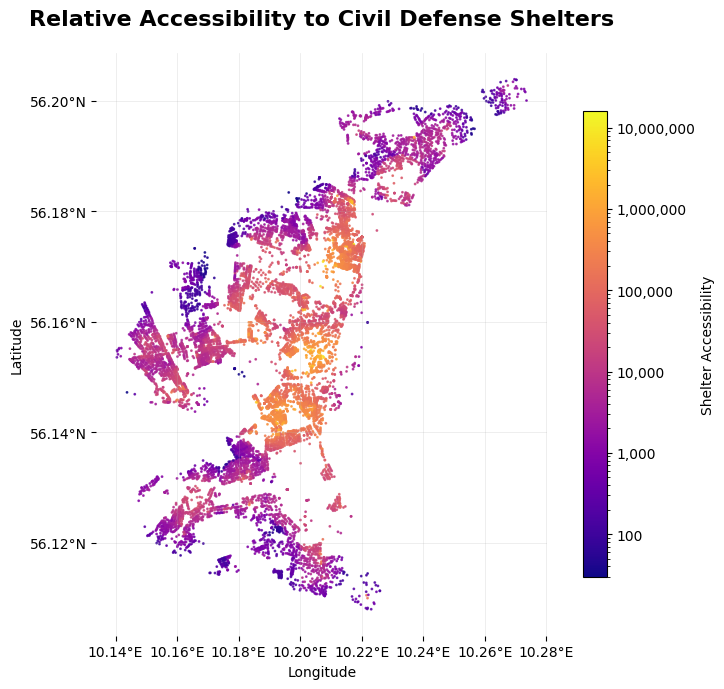


Accessibility Summary:
Min: 29.26
Max: 16015737.31
Median: 13794.19
Mean: 99290.49


In [5]:
## Option 1: Full Range

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import geopandas as gpd
import pandas as pd
from matplotlib.cm import ScalarMappable as sm
from matplotlib.colors import LogNorm
import matplotlib.patches as mpatches
from matplotlib.cm import ScalarMappable

# ==== SETUP ====

# Join accessibility data (building_accessibility) with buildings geometry (GeoDataFrame)
buildings_with_access = buildings.merge(building_accessibility, 
                                       left_on='id_lokalId', 
                                       right_on='id_lokalId', 
                                       how='left')

print(f"Buildings with accessibility data: {buildings_with_access.shape[0]:,}")
print(f"Buildings with non-null accessibility: {buildings_with_access['accessibility'].notna().sum():,}")

# Filter out infinite accessibility values
buildings_plot = buildings_with_access[
    buildings_with_access['accessibility'].notna() & 
    ~np.isinf(buildings_with_access['accessibility'])
].copy()

print(f"Buildings for plotting (after filtering Inf): {buildings_plot.shape[0]:,}")
print(f"Accessibility range: {buildings_plot['accessibility'].min():.2f} to {buildings_plot['accessibility'].max():.2f}")

# ==== CONSTRUCT PLOT ====

# Create plot
fig, ax = plt.subplots(1, 1, figsize=(8, 7))

# log-normalize accessibility scores
norm = LogNorm(vmin=buildings_plot['accessibility'].min(), 
               vmax=buildings_plot['accessibility'].max())

# Plot buildings with accessibility values using log scale
buildings_plot.plot(
    column='accessibility',
    ax=ax,
    cmap='plasma',
    norm=norm,
    markersize=1,
    alpha=0.8,
    legend=False,
    legend_kwds={'label': 'Shelter Accessibility (log10)', 
                 'orientation': 'vertical',
                 'shrink': 0.8}
)

ax.grid(True, alpha=0.3, linestyle='-', linewidth=0.5)

# Manually creating legend to view numbers without scientific notation
scalar_mappable = ScalarMappable(cmap='plasma', norm=norm)
scalar_mappable.set_array([])
cbar = plt.colorbar(scalar_mappable, ax=ax, shrink=0.8, label='Shelter Accessibility')

cbar.ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{int(x):,}' if x >= 1 else f'{x:.2f}'))

# Set Title & Axis Labels
ax.set_title('Relative Accessibility to Civil Defense Shelters', 
             fontsize=16, fontweight='bold', pad=20)

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Ensuring clean formatting of coordinates on each axis
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{x:.2f}°E'))
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, p: f'{y:.2f}°N'))

# Remove frame and adjust layout for neater plot
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()

# ==== DISPLAY PLOT & SUMMARY STATISTICS ====

plt.show()

# Summary statistics
print(f"\nAccessibility Summary:")
print(f"Min: {buildings_plot['accessibility'].min():.2f}")
print(f"Max: {buildings_plot['accessibility'].max():.2f}")
print(f"Median: {buildings_plot['accessibility'].median():.2f}")
print(f"Mean: {buildings_plot['accessibility'].mean():.2f}")

Range: 29 to 16015737


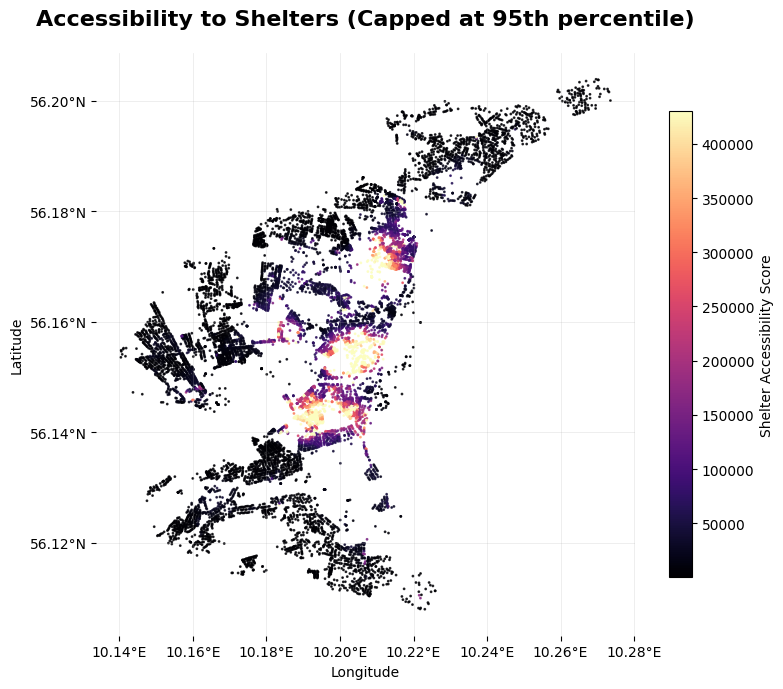


Capped Accessibility Summary:
Min: 29.26
Max: 430288.91
Median: 13794.19
Mean: 73097.54
95th percentile cutoff applied: 430288.91


In [6]:
## Option 2: Winsorize (capping values)

import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import pandas as pd
import matplotlib.ticker as ticker

# ==== SETUP ====

# Filter out infinite accessibility values
building_accessibility = building_accessibility[
    np.isfinite(building_accessibility['accessibility'])
].copy()

# Calculate the nth percentile cutoff on finite values
access_cutoff = building_accessibility['accessibility'].quantile(0.95) # can be adjusted as needed

# Create capped accessibility column
building_accessibility['access_capped'] = np.minimum(
    building_accessibility['accessibility'], 
    access_cutoff
)

print(f"Range: {building_accessibility['accessibility'].min():.0f} to {building_accessibility['accessibility'].max():.0f}")

# Merge with building geometries for plotting
buildings_with_access_capped = buildings.merge(
    building_accessibility, 
    left_on='id_lokalId', 
    right_on='id_lokalId', 
    how='left'
)

# Filter for buildings with valid accessibility data
buildings_plot = buildings_with_access_capped.loc[
    buildings_with_access_capped['access_capped'].notna(), :
].copy()

# ==== CONSTRUCT PLOT ====

# Create plot
fig, ax = plt.subplots(1, 1, figsize=(8, 7))

# Plot buildings with capped accessibility values
buildings_plot.plot(
    column='access_capped',
    ax=ax,
    cmap='magma',
    markersize=1,
    alpha=0.8,
    legend=True,
    legend_kwds={'label': 'Shelter Accessibility Score', 
                 'orientation': 'vertical',
                 'shrink': 0.8},
    aspect=None
)

ax.grid(True, alpha=0.3, linestyle='-', linewidth=0.5)

# Set Title & Axis Labels
ax.set_title('Accessibility to Shelters (Capped at 95th percentile)', 
             fontsize=16, fontweight='bold', pad=20)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Ensuring clean formatting of coordinates on each axis
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{x:.2f}°E'))
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, p: f'{y:.2f}°N'))

# Remove frame and adjust layout for neater plot
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()

# ==== DISPLAY PLOT & SUMMARY STATISTICS ====

plt.show()

# Summary Statistics
print(f"\nCapped Accessibility Summary:")
print(f"Min: {building_accessibility['access_capped'].min():.2f}")
print(f"Max: {building_accessibility['access_capped'].max():.2f}")
print(f"Median: {building_accessibility['access_capped'].median():.2f}")
print(f"Mean: {building_accessibility['access_capped'].mean():.2f}")
print(f"95th percentile cutoff applied: {access_cutoff:.2f}")

Buildings with finite accessibility: 11,131
Accessibility range: 29.26 to 16015737.31
Quantile breaks: ['29.26', '1805.53', '6958.34', '27409.36', '120575.33', '16015737.31']
Quantile distribution:
access_quantile
Medium         2230
Low            2228
Low-Medium     2225
Medium-High    2225
High           2223
Name: count, dtype: int64
Buildings with quantile data: 19,354
Buildings for plotting: 11,131


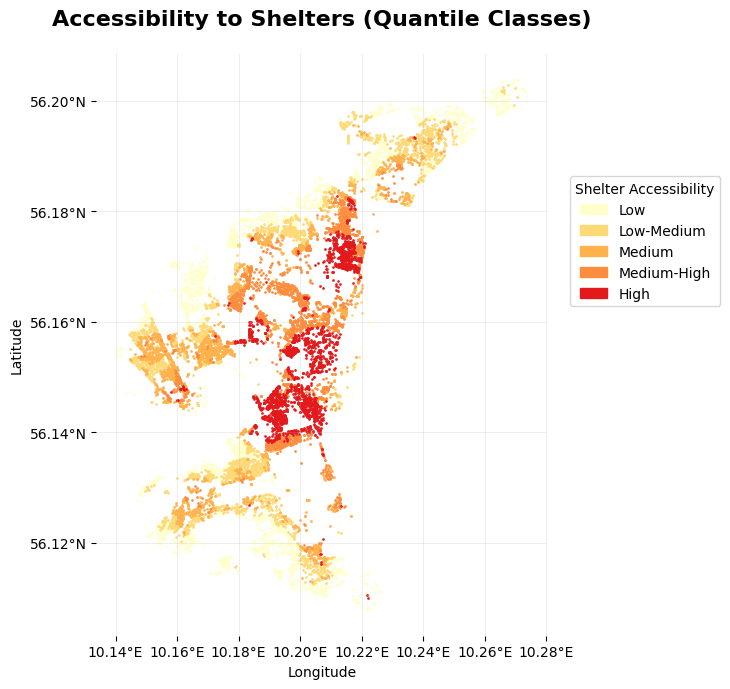


Quantile Class Summary:
Low: 2,228 buildings, range: 29.26 - 1805.53
Low-Medium: 2,225 buildings, range: 1805.72 - 6958.34
Medium: 2,230 buildings, range: 6958.79 - 27409.36
Medium-High: 2,225 buildings, range: 27447.04 - 120575.33
High: 2,223 buildings, range: 120698.02 - 16015737.31


In [7]:
## Option 3: Quantile Classification

import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import pandas as pd
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches

# ==== SETUP ====

# Make sure accessibility is numeric and drop Inf
buildings_with_access = building_accessibility[
    np.isfinite(building_accessibility['accessibility'])
].copy()

print(f"Buildings with finite accessibility: {len(buildings_with_access):,}")
print(f"Accessibility range: {buildings_with_access['accessibility'].min():.2f} to {buildings_with_access['accessibility'].max():.2f}")

# Generate labels from "Low" to "High"
labels = ["Low", "Low-Medium", "Medium", "Medium-High", "High"]

# Create quantile-based bins
breaks = np.quantile(buildings_with_access['accessibility'], [0, 0.2, 0.4, 0.6, 0.8, 1.0])
print(f"Quantile breaks: {[f'{b:.2f}' for b in breaks]}")

# Assign bins and label them
buildings_with_access['access_quantile'] = pd.cut(
    buildings_with_access['accessibility'], 
    bins=breaks, 
    labels=labels, 
    include_lowest=True
)

print(f"Quantile distribution:")
print(buildings_with_access['access_quantile'].value_counts())

# Merge with building geometries for plotting
buildings_plot_data = buildings.merge(buildings_with_access, 
                                     left_on='id_lokalId', 
                                     right_on='id_lokalId', 
                                     how='left')

print(f"Buildings with quantile data: {buildings_plot_data.shape[0]:,}")

# Filter for buildings with valid quantile data
buildings_plot = buildings_plot_data[
    buildings_plot_data['access_quantile'].notna()
].copy()

print(f"Buildings for plotting: {buildings_plot.shape[0]:,}")

# ==== CONSTRUCT PLOT ====

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(8, 7))

# Creating colour palette for plot (YlOrRd)
ylord_colors = ['#FFFFCC', '#FED976', '#FEB24C', '#FD8D3C', '#E31A1C']
color_map = dict(zip(labels, ylord_colors))

# Plot buildings by quantile class
for i, label in enumerate(labels):
    buildings_class = buildings_plot[buildings_plot['access_quantile'] == label]
    if len(buildings_class) > 0:
        buildings_class.plot(
            ax=ax,
            color=ylord_colors[i],
            markersize=1,
            alpha=0.9,
            label=label
        )

ax.grid(True, alpha=0.3, linestyle='-', linewidth=0.5)

# Create legend
legend_elements = [mpatches.Patch(color=color, label=label) 
                  for label, color in color_map.items()]

ax.legend(handles=legend_elements, 
         title='Shelter Accessibility',
         loc='upper right',
         bbox_to_anchor=(1.4, 0.8))

# Set Title & Axis labels
ax.set_title('Accessibility to Shelters (Quantile Classes)', 
             fontsize=16, fontweight='bold', pad=20)

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Ensuring clean formatting of coordinates on each axis
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{x:.2f}°E'))
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, p: f'{y:.2f}°N'))

# Remove frame and adjust layput for neater plot
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()

# ==== DISPLAY PLOT & SUMMARY OF RESULTS ====

plt.show()

# Summary of classes
print(f"\nQuantile Class Summary:")
for i, label in enumerate(labels):
    class_data = buildings_with_access[buildings_with_access['access_quantile'] == label]
    if len(class_data) > 0:
        print(f"{label}: {len(class_data):,} buildings, range: {class_data['accessibility'].min():.2f} - {class_data['accessibility'].max():.2f}")

## RELATIVE ACCESSIBILITY INDEX (RAI) == RELATIVE EQUITY

Now that we calculated accessibility scores for the city, we can derive a standardized version of the accessibility score. It tells you how a specific location compares to the average; how it is served in absolute termes, but not how that compares to its demand (resident count). RAI is unitless and ideal for mapping inequality.

RAI Value	Meaning:

* = 1	Exactly average accessibility
* < 1	Below average (under-served)
* \> 1	Above average (well served)
* = 0	No access at all (extremely under-served)

Buildings with finite capped accessibility: 11,131
Mean accessibility (for RAI calculation): 73097.54
RAI range: 0.000 to 5.887
RAI mean (should be ~1.0): 1.000

RAI Distribution:
rai
Under-served (<0.5)        7135
Well-served (>1.5)         2332
Below average (0.5-1.0)    1027
Above average (1.0-1.5)     637
Name: count, dtype: int64
Buildings with RAI data: 19,354
Buildings for plotting: 11,131


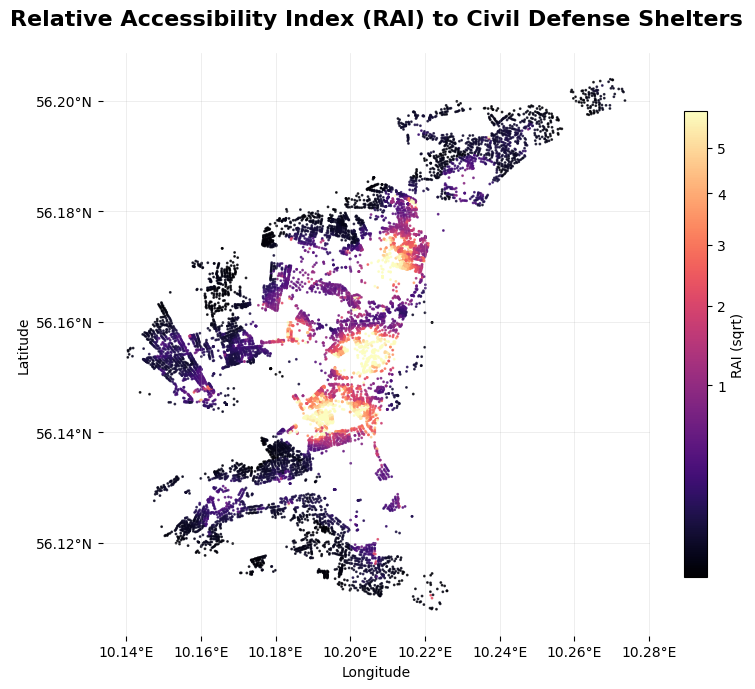


RAI Statistics:
Min: 0.000
25th percentile: 0.036
Median: 0.189
75th percentile: 1.136
Max: 5.887

RAI Interpretation:
= 1: Exactly average accessibility
< 1: Below average (under-served)
> 1: Above average (well served)
= 0: No access at all (extremely under-served)

RAI Categories:
Exactly average (RAI = 1.0): 0 buildings
Below average (RAI < 1.0): 8,162 buildings (73.3%)
Above average (RAI > 1.0): 2,969 buildings (26.7%)
No access (RAI = 0.0): 0 buildings


In [8]:
## RELATIVE ACCESSIBILITY INDEX (RAI) == RELATIVE EQUITY

import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import pandas as pd
from matplotlib.colors import PowerNorm

# ==== SETUP ====

# Filter for finite access_capped values
buildings_with_access = building_accessibility[
    np.isfinite(building_accessibility['access_capped'])
].copy()

print(f"Buildings with finite capped accessibility: {len(buildings_with_access):,}")

# ==== COMPUTE RAI ====

# Calculate mean accessibility for RAI
mean_access = buildings_with_access['access_capped'].mean()
print(f"Mean accessibility (for RAI calculation): {mean_access:.2f}")

# Add standardized RAI to data
buildings_with_access['rai'] = buildings_with_access['access_capped'] / mean_access

print(f"RAI range: {buildings_with_access['rai'].min():.3f} to {buildings_with_access['rai'].max():.3f}")
print(f"RAI mean (should be ~1.0): {buildings_with_access['rai'].mean():.3f}")

# Standardized RAI interpretation summary
rai_summary = pd.cut(buildings_with_access['rai'], 
                     bins=[0, 0.5, 1.0, 1.5, np.inf], 
                     labels=['Under-served (<0.5)', 'Below average (0.5-1.0)', 
                            'Above average (1.0-1.5)', 'Well-served (>1.5)'])
print(f"\nRAI Distribution:")
print(rai_summary.value_counts())

# Merge with building geometries for plotting
buildings_plot_data = buildings.merge(buildings_with_access, 
                                     left_on='id_lokalId', 
                                     right_on='id_lokalId', 
                                     how='left')
print(f"Buildings with RAI data: {buildings_plot_data.shape[0]:,}")

# Filter for buildings with valid RAI data
buildings_plot = buildings_plot_data[
    buildings_plot_data['rai'].notna()
].copy()
print(f"Buildings for plotting: {buildings_plot.shape[0]:,}")

# ==== CONSTRUCTING PLOT ====

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(8, 7))

# Plot buildings with RAI values using sqrt transformation
buildings_plot.plot(
    column='rai',
    ax=ax,
    cmap='magma',
    norm=PowerNorm(gamma=0.5), # sqrt transformation
    markersize=1,
    alpha=0.8,
    legend=True,
    legend_kwds={'label': 'RAI (sqrt)', 
                 'orientation': 'vertical',
                 'shrink': 0.8},
    aspect=None
)

ax.grid(True, alpha=0.3, linestyle='-', linewidth=0.5)

# Set Title & Axis labels
ax.set_title('Relative Accessibility Index (RAI) to Civil Defense Shelters', 
             fontsize=16, fontweight='bold', pad=20)

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Ensuring clean formatting of coordinates on each axis
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{x:.2f}°E'))
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, p: f'{y:.2f}°N'))

# Remove the frame and adjust layout for neater plot
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()

# ==== DISPLAY PLOT & RAI STATISTICS ====

plt.show()

# Detailed RAI statistics
print(f"\nRAI Statistics:")
print(f"Min: {buildings_with_access['rai'].min():.3f}")
print(f"25th percentile: {buildings_with_access['rai'].quantile(0.25):.3f}")
print(f"Median: {buildings_with_access['rai'].median():.3f}")
print(f"75th percentile: {buildings_with_access['rai'].quantile(0.75):.3f}")
print(f"Max: {buildings_with_access['rai'].max():.3f}")

# RAI Interpretation Key
print(f"\nRAI Interpretation:")
print(f"= 1: Exactly average accessibility")
print(f"< 1: Below average (under-served)")
print(f"> 1: Above average (well served)")
print(f"= 0: No access at all (extremely under-served)")

# Count buildings in each category
exactly_avg = (buildings_with_access['rai'] == 1.0).sum()
below_avg = (buildings_with_access['rai'] < 1.0).sum()
above_avg = (buildings_with_access['rai'] > 1.0).sum()
no_access = (buildings_with_access['rai'] == 0.0).sum()

print(f"\nRAI Categories:")
print(f"Exactly average (RAI = 1.0): {exactly_avg:,} buildings")
print(f"Below average (RAI < 1.0): {below_avg:,} buildings ({below_avg/len(buildings_with_access)*100:.1f}%)")
print(f"Above average (RAI > 1.0): {above_avg:,} buildings ({above_avg/len(buildings_with_access)*100:.1f}%)")
print(f"No access (RAI = 0.0): {no_access:,} buildings")

## LISA (Local Indicators of Spatial Association, Talen and Anselin)

A spatial autocorrelation statistic that identifies clusters and outliers in spatial data. While originally applied to polygons, LISA is frequently used on point data — as long as: 

1. Each point has a numeric value (e.g., RAI), and 
2. You define a spatial weights matrix (i.e., which points are neighbors)

It answers the question:  Are there pockets of low access in otherwise high-access areas (and vice versa)? Are high-accessibility buildings clustered together? We can see with naked eye that yes, in 1951 Aarhus they are, but LISA offers a good formal measure.


LISA comes in the following categories:

* High-High	Hot spot: well-served area
* Low-Low	Cold spot: under-served cluster
* High-Low	Outlier: well-served among poor
* Low-High	Outlier: poorly served among good

LISA detects spatial patterns and lets us plot equity hot/cold spots.

Useful for policy targeting or spatial justice studies. But again, population numbers are not calculated in; this is just a spatial index!

In [9]:
## LISA

import geopandas as gpd
import pandas as pd
import numpy as np
from libpysal.weights import DistanceBand
from esda.moran import Moran_Local
import warnings

warnings.filterwarnings('ignore')

# ==== SETUP ====

# Create GeoDataFrame by merging RAI data with building geometries
buildings_rai_geo = buildings.merge(buildings_with_access, 
                                   left_on='id_lokalId', 
                                   right_on='id_lokalId', 
                                   how='inner')

# Transform to projected coordinate system (ETRS89 / UTM zone 32N for Denmark) for analysis
buildings_proj = buildings_rai_geo.to_crs('EPSG:25832')

# Get coordinates
coords_proj = buildings_proj.geometry.get_coordinates().values

# Create spatial weights using 250m threshold
weights_list = DistanceBand.from_dataframe(buildings_proj, 
                                          threshold=250, 
                                          binary=True,
                                          alpha=-1.0)

# Row-standardize weights
weights_list.transform = 'R'

print(f"\nSpatial weights created:")
print(f" - Number of observations: {weights_list.n}")
print(f" - Average neighbors per building: {weights_list.mean_neighbors:.1f}")

# ==== COMPUTE LOCAL MORAN'S I ====

# Compute local Moran's I
local_moran = Moran_Local(buildings_proj['rai'], weights_list)

# Attach results to data
buildings_proj['Ii'] = local_moran.Is  # Local Moran's I statistic
buildings_proj['Z_Ii'] = local_moran.z_sim  # Standardized z-score
buildings_proj['p_value'] = local_moran.p_sim  # p-value

# Add quadrant classification
buildings_proj['quadrant'] = local_moran.q

print(f"\nLocal Moran's I Statistics:")
print(f"Mean Local I: {buildings_proj['Ii'].mean():.4f}")
print(f"Standard deviation: {buildings_proj['Ii'].std():.4f}")
print(f"Min I: {buildings_proj['Ii'].min():.4f}")
print(f"Max I: {buildings_proj['Ii'].max():.4f}")

print(f"\nSignificance levels (p < 0.05): {(buildings_proj['p_value'] < 0.05).sum():,} buildings ({(buildings_proj['p_value'] < 0.05).mean()*100:.1f}%)")
print(f"Highly significant (p < 0.01): {(buildings_proj['p_value'] < 0.01).sum():,} buildings ({(buildings_proj['p_value'] < 0.01).mean()*100:.1f}%)")

# Quadrant Interpretation
quadrant_labels = {
    1: 'HH (High-High)',
    2: 'LH (Low-High)', 
    3: 'LL (Low-Low)',
    4: 'HL (High-Low)'
}

print(f"\nSpatial clusters (quadrants):")
for q in [1, 2, 3, 4]:
    count = (buildings_proj['quadrant'] == q).sum()
    if count > 0:
        print(f"  {quadrant_labels[q]}: {count:,} buildings")

# ==== DISPLAY RESULTS ====

# Show sample of results
print(f"\nSample of LISA results:")
sample_cols = ['id_lokalId', 'rai', 'Ii', 'Z_Ii', 'p_value', 'quadrant']
print(buildings_proj[sample_cols].head(10))

('WARNING: ', 158, ' is an island (no neighbors)')
('WARNING: ', 1168, ' is an island (no neighbors)')
('WARNING: ', 2478, ' is an island (no neighbors)')
('WARNING: ', 10135, ' is an island (no neighbors)')

Spatial weights created:
 - Number of observations: 11131
 - Average neighbors per building: 114.7

Local Moran's I Statistics:
Mean Local I: 0.8253
Standard deviation: 1.7135
Min I: -1.6490
Max I: 8.8977

Significance levels (p < 0.05): 10,264 buildings (92.2%)
Highly significant (p < 0.01): 9,728 buildings (87.4%)

Spatial clusters (quadrants):
  HH (High-High): 2,770 buildings
  LH (Low-High): 586 buildings
  LL (Low-Low): 7,576 buildings
  HL (High-Low): 199 buildings

Sample of LISA results:
                             id_lokalId       rai        Ii       Z_Ii  \
0  a64781e3-0a37-49ad-a31a-00102fad9e25  0.389693  0.146736   3.727991   
1  ffe3ca03-3939-4e40-95a3-001aa761a84c  0.003989  0.369722   2.872203   
2  c1c58a0c-1305-45a4-9535-001ac46ed0c3  3.208484  1.335924  11.538

Mean RAI: 1.0000

LISA Cluster Distribution:
  Low-Low: 7,175 buildings (64.5%)
  High-High: 2,677 buildings (24.0%)
  Not Significant: 867 buildings (7.8%)
  Low-High: 285 buildings (2.6%)
  High-Low: 127 buildings (1.1%)


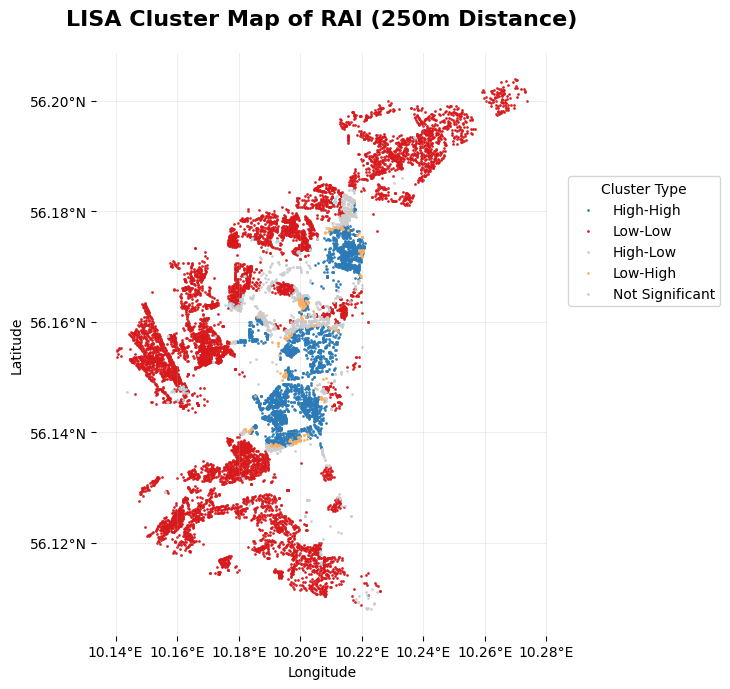


LISA Cluster Interpretation:
High-High (Hot Spots): Areas with high RAI surrounded by high RAI areas
Low-Low (Cold Spots): Areas with low RAI surrounded by low RAI areas
High-Low (Outliers): High RAI areas surrounded by low RAI areas
Low-High (Outliers): Low RAI areas surrounded by high RAI areas
Not Significant: No significant spatial clustering

RAI Statistics by Cluster:
  High-High: Mean RAI = 3.393 (n=2,677)
  Low-Low: Mean RAI = 0.128 (n=7,175)
  High-Low: Mean RAI = 1.713 (n=127)
  Low-High: Mean RAI = 0.791 (n=285)
  Not Significant: Mean RAI = 0.791 (n=867)


In [10]:
## LISA RESULTS PLOT

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# ==== SETUP ====

# Calculate mean RAI
buildings_proj = buildings_proj[buildings_proj['rai'].notna()].copy()
mean_rai = buildings_proj['rai'].mean()
print(f"Mean RAI: {mean_rai:.4f}")

# Create LISA cluster classification
def classify_lisa_cluster(row):
    rai = row['rai']
    Ii = row['Ii']
    p_value = row['p_value']
    
    if rai >= mean_rai and Ii >= 0 and p_value < 0.05:
        return "High-High"
    elif rai <= mean_rai and Ii >= 0 and p_value < 0.05:
        return "Low-Low"
    elif rai >= mean_rai and Ii < 0 and p_value < 0.05:
        return "High-Low"
    elif rai <= mean_rai and Ii < 0 and p_value < 0.05:
        return "Low-High"
    else:
        return "Not Significant"

# Apply Classification
buildings_proj['lisa_cluster'] = buildings_proj.apply(classify_lisa_cluster, axis=1)

# Show Cluster Distribution
print(f"\nLISA Cluster Distribution:")
cluster_counts = buildings_proj['lisa_cluster'].value_counts()
for cluster, count in cluster_counts.items():
    pct = count / len(buildings_proj) * 100
    print(f"  {cluster}: {count:,} buildings ({pct:.1f}%)")

# Define Colors
cluster_colors = {
    "High-High": "#2c7bb6",
    "Low-Low": "#d7191c", 
    "High-Low": "#abd9e9",
    "Low-High": "#fdae61",
    "Not Significant": "#cccccc"
}

# Set appropriate CRS for plotting
buildings_proj = buildings_proj.to_crs('EPSG:4326')

# ==== CONSTRUCTING PLOT ====

# Create plot
fig, ax = plt.subplots(1, 1, figsize=(8, 7))

# Plot each cluster type separately to control colors
for cluster_type, color in cluster_colors.items():
    cluster_data = buildings_proj[buildings_proj['lisa_cluster'] == cluster_type]
    if len(cluster_data) > 0:
        cluster_data.plot(
            ax=ax,
            color=color,
            markersize=1,
            alpha=0.9,
            label=cluster_type
        )

ax.grid(True, alpha=0.3, linestyle='-', linewidth=0.5)

# Set Legend
ax.legend(title='Cluster Type', 
         loc='upper right',
         bbox_to_anchor=(1.4, 0.8))

# Set Title & Axis Labels
ax.set_title('LISA Cluster Map of RAI (250m Distance)', 
             fontsize=16, fontweight='bold', pad=20)

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Ensuring clean formatting of coordinates on each axis
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{x:.2f}°E'))
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, p: f'{y:.2f}°N'))

# Remove frame and adjust layout for neater plot
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()

# ==== DISPLAY PLOT & SUMMARY STATISTICS ====

plt.show()

# LISA Interpretation
print(f"\nLISA Cluster Interpretation:")
print(f"High-High (Hot Spots): Areas with high RAI surrounded by high RAI areas")
print(f"Low-Low (Cold Spots): Areas with low RAI surrounded by low RAI areas") 
print(f"High-Low (Outliers): High RAI areas surrounded by low RAI areas")
print(f"Low-High (Outliers): Low RAI areas surrounded by high RAI areas")
print(f"Not Significant: No significant spatial clustering")

# Summary statistics by cluster
print(f"\nRAI Statistics by Cluster:")
for cluster in ["High-High", "Low-Low", "High-Low", "Low-High", "Not Significant"]:
    cluster_data = buildings_proj[buildings_proj['lisa_cluster'] == cluster]
    if len(cluster_data) > 0:
        mean_rai_cluster = cluster_data['rai'].mean()
        print(f"  {cluster}: Mean RAI = {mean_rai_cluster:.3f} (n={len(cluster_data):,})")

## How They Work Together

* **Accessibility score:** offers a base arbitrary metric
* **RAI:** Relative performance from accessibility
* **LISA:** Are high or low RAI scores spatially clustered?

## COEFFICIENTS

here’s a strong reason to complement your accessibility map with Gini and Lorenz curves. These tools answer a different, non-spatial question that maps alone can’t fully capture: Lorenz curve visualizes the distribution of accessibility but erases the geographic context. Gini Index gives a single number summarizing inequality, which is great for temporal comparison or  public vs all shelters, comparing districts, cities or countries; before/after intervenion.

### Gini & Lorenz
Gini = Area between line of equality and Lorenz curve (normalized). 
Ranges from 0 (perfect equality) to 1 (maximum inequality). 0.2-0.4 is moderate inequality.

How do we understand Lorenz curve? It should be as diagonal as possible:

🎯 Closer to diagonal = More equal distribution

📉 Farther from diagonal =	Greater inequality

🎣 Flat at start = Some buildings have almost no accessibility

🧨 Steep at end	 = A few buildings hold most of the accessibility

Valid RAI values for analysis: 11,131
RAI range: 0.000 to 5.887
Gini Coefficient: 0.729
This is high inequality!


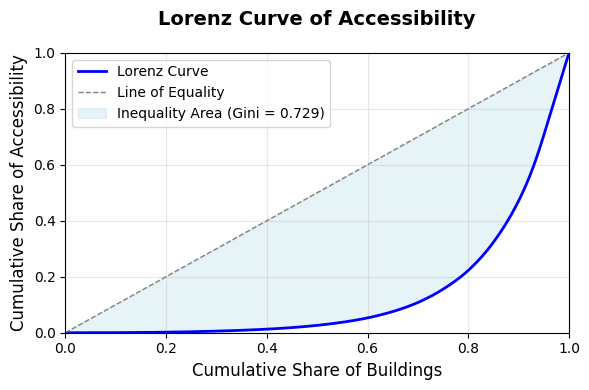


Inequality Analysis:
Perfect equality (Gini = 0): All buildings have exactly the same accessibility
Perfect inequality (Gini = 1): One building has all accessibility, others have none
Observed Gini = 0.729: High inequality

RAI Distribution Quantiles:
10th percentile: 0.009
25th percentile: 0.036
Median (50th): 0.189
75th percentile: 1.136
90th percentile: 3.608

Most accessible buildings (top 5):
  Building 677e7353-6bcb-4798-8d23-0031877332c9: RAI = 5.887
  Building f35f6006-3b91-4f23-9d06-006f532c8621: RAI = 5.887
  Building bebd4ce1-80b8-43c0-bfb8-019eedfc3daf: RAI = 5.887
  Building 2c7212d0-b2b6-4f46-a105-01bf403d8cad: RAI = 5.887
  Building 671b1c44-ae53-4c02-b8d5-0217c3fa9352: RAI = 5.887

Least accessible buildings (bottom 5):
  Building 0a405b66-5f71-4879-9a6c-2e37103af9b6: RAI = 0.000
  Building d27fb8bb-1374-464c-829c-3f5ffa789565: RAI = 0.000
  Building d0a14207-6b4a-4298-a8be-993f87c494dc: RAI = 0.000
  Building bcbf9ea7-6693-4454-9566-c83c7be366f2: RAI = 0.000
  Buildin

In [11]:
## GINI-LORENZ

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# ==== SETUP: GINI COEFF & LORENZ CURVE ====

def gini_coefficient(x):
    """Calculate Gini coefficient"""
    # Sort the array
    sorted_x = np.sort(x)
    n = len(x)
    
    # Calculate Gini coefficient
    cumsum = np.cumsum(sorted_x)
    gini = (2 * np.sum((np.arange(1, n + 1) * sorted_x))) / (n * cumsum[-1]) - (n + 1) / n
    return gini

def lorenz_curve(x):
    """Calculate Lorenz curve coordinates"""
    # Sort the array
    sorted_x = np.sort(x)
    n = len(x)
    
    # Calculate cumulative shares
    cumulative_pop = np.arange(1, n + 1) / n
    cumulative_income = np.cumsum(sorted_x) / np.sum(sorted_x)
    
    # Add origin point
    cumulative_pop = np.insert(cumulative_pop, 0, 0)
    cumulative_income = np.insert(cumulative_income, 0, 0)
    
    return cumulative_pop, cumulative_income

# Drop NA / Inf values
access_vals = buildings_proj['rai']
access_vals = access_vals[np.isfinite(access_vals) & (access_vals > 0)]

print(f"Valid RAI values for analysis: {len(access_vals):,}")
print(f"RAI range: {access_vals.min():.3f} to {access_vals.max():.3f}")

# Calculate Gini coefficient
gini_val = gini_coefficient(access_vals)
print(f"Gini Coefficient: {gini_val:.3f}")

# Interpret Gini coefficient
if gini_val > 0.4:
    print("This is high inequality!")
elif gini_val > 0.3:
    print("This indicates moderate inequality")
else:
    print("This indicates relatively low inequality")

# Calculate Lorenz curve
cumulative_pop, cumulative_income = lorenz_curve(access_vals)

# ==== CONSTRUCTING PLOT ====

# Create Lorenz curve plot
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

# Plot Lorenz curve
ax.plot(cumulative_pop, cumulative_income, 
        color='blue', linewidth=2, label='Lorenz Curve')

# Plot line of equality
ax.plot([0, 1], [0, 1], 
        linestyle='--', color='grey', linewidth=1, label='Line of Equality')

# Fill area between curves to show inequality
ax.fill_between(cumulative_pop, cumulative_income, cumulative_pop, 
                alpha=0.3, color='lightblue', label=f'Inequality Area (Gini = {gini_val:.3f})')

# Set Title & Axis Labels
ax.set_xlabel('Cumulative Share of Buildings', fontsize=12)
ax.set_ylabel('Cumulative Share of Accessibility', fontsize=12)

ax.set_title('Lorenz Curve of Accessibility', fontsize=14, fontweight='bold', pad=20)
ax.grid(True, alpha=0.3)

# Set Legend
ax.legend()

# Set Axis Range
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)

# Adjust layout for neater plot
plt.tight_layout()

# ==== DISPLAY PLOT & ANALYSIS RESULTS ====

plt.show()

# Additional analysis
print(f"\nInequality Analysis:")
print(f"Perfect equality (Gini = 0): All buildings have exactly the same accessibility")
print(f"Perfect inequality (Gini = 1): One building has all accessibility, others have none")
print(f"Observed Gini = {gini_val:.3f}: {'High' if gini_val > 0.4 else 'Moderate' if gini_val > 0.3 else 'Low'} inequality")

# Quantile analysis
quantiles = np.quantile(access_vals, [0.1, 0.25, 0.5, 0.75, 0.9])
print(f"\nRAI Distribution Quantiles:")
print(f"10th percentile: {quantiles[0]:.3f}")
print(f"25th percentile: {quantiles[1]:.3f}") 
print(f"Median (50th): {quantiles[2]:.3f}")
print(f"75th percentile: {quantiles[3]:.3f}")
print(f"90th percentile: {quantiles[4]:.3f}")

# Sample of most and least accessible buildings
print(f"\nMost accessible buildings (top 5):")
top_buildings = buildings_proj.nlargest(5, 'rai')[['id_lokalId', 'rai']]
for idx, row in top_buildings.iterrows():
    print(f"  Building {row['id_lokalId']}: RAI = {row['rai']:.3f}")

print(f"\nLeast accessible buildings (bottom 5):")
bottom_buildings = buildings_proj.nsmallest(5, 'rai')[['id_lokalId', 'rai']]
for idx, row in bottom_buildings.iterrows():
    print(f"  Building {row['id_lokalId']}: RAI = {row['rai']:.3f}")

In [55]:
## VISUAL EQUITY IN SPACE

import geopandas as gpd
import pandas as pd
import numpy as np
import folium
from folium import plugins
from branca.colormap import LinearColormap
from tkinter import *
from shapely.geometry import Polygon

# ==== SETUP ====

## START: Code adapted from Arthur Vaisse (2014) on Stack Overflow 
## Post URL: https://stackoverflow.com/questions/26583602/displaying-data-in-a-hexagonal-grid-using-python

def create_hex_grid_r_style(boundary_gdf, cell_size=250):
    """Create hexagonal grid using the tkinter hexagon math"""
    
    bounds = boundary_gdf.total_bounds
    
    size = cell_size / 2
    Δx = (size**2 - (size/2)**2)**0.5  # horizontal spacing component
    
    # Grid spacing
    x_spacing = 2 * Δx  # Horizontal distance between hex centers
    y_spacing = 1.5 * size  # Vertical distance between hex centers
    
    hex_data = []
    grid_id = 1
    
    # Calculate how many cells are needed
    grid_width = int((bounds[2] - bounds[0]) / x_spacing) + 2
    grid_height = int((bounds[3] - bounds[1]) / y_spacing) + 2
    
    # Generate grid
    for yCell in range(grid_height):
        for xCell in range(grid_width):
            
            # Compute pixel coordinate of the center of the cell
            pix_x = bounds[0] + Δx + 2*Δx*xCell
            if yCell % 2 == 1:
                pix_x += Δx
            
            pix_y = bounds[1] + size + yCell*1.5*size
            
            # Create hexagon vertices
            point1 = (pix_x+Δx, pix_y+size/2)
            point2 = (pix_x+Δx, pix_y-size/2)
            point3 = (pix_x   , pix_y-size  )
            point4 = (pix_x-Δx, pix_y-size/2)
            point5 = (pix_x-Δx, pix_y+size/2)
            point6 = (pix_x   , pix_y+size  )
            
            # Create the hexagon polygon
            hexagon = Polygon([point1, point2, point3, point4, point5, point6])
            
            # Only add if it intersects with the Aarhus 1952 boundary
            if hexagon.intersects(boundary_gdf.unary_union):
                hex_data.append({
                    'grid_id': grid_id,
                    'geometry': hexagon
                })
                grid_id += 1
    
    grid = gpd.GeoDataFrame(hex_data, crs=boundary_gdf.crs)
    return grid
    
## END: Code adapted from Arthur Vaisse (2014) on Stack Overflow ends here.

shelters = shelters.copy()
print(f"Using {len(shelters)} shelters")

# Transform to projected CRS (EPSG:25832) for analysis
aarhus_proj = aarhus_city1952.to_crs('EPSG:25832')
shelters_proj = shelters.to_crs('EPSG:25832') 
buildings_proj = buildings.to_crs('EPSG:25832')

# ==== ANALYSIS ====

# Create grid
grid = create_hex_grid_r_style(aarhus_proj, cell_size=250)

grid_shelters_full = gpd.sjoin(grid, shelters_proj, how='left', predicate='contains')
grid_shelters = gpd.clip(grid_shelters_full, aarhus_proj)

buildings_subset = buildings_proj[['geometry', 'est_pop']].copy()
grid_residents_full = gpd.sjoin(grid, buildings_subset, how='left', predicate='contains')
grid_residents = gpd.clip(grid_residents_full, aarhus_proj)

# Counting number of shelters
shelter_counts = (grid_shelters
                 .drop(columns='geometry')
                 .groupby('grid_id')
                 .agg({
                     'shelterID': 'size',
                     'Seats': lambda x: x.sum(skipna=True)
                 })
                 .rename(columns={'shelterID': 'count', 'Seats': 'shelter_places'})
                 .reset_index())

# Use only BDG shelters
bdg_data = grid_shelters[grid_shelters['shelter_type'] == 'BDG']

bdg_summary = (bdg_data
              .drop(columns='geometry')
              .groupby('grid_id')
              .agg({
                  'shelterID': 'size',
                  'Seats': lambda x: x.sum(skipna=True)
              })
              .rename(columns={'shelterID': 'bdg_count', 'Seats': 'bdg_capacity'})
              .reset_index())

# Counting number of residents
resident_count = (grid_residents
                 .drop(columns='geometry')
                 .groupby('grid_id') 
                 .agg({'est_pop': lambda x: x.sum(skipna=True)})
                 .rename(columns={'est_pop': 'total_res'})
                 .reset_index())

# Merge summaries + grid
grid_final = (grid
             .merge(bdg_summary, on='grid_id', how='left')
             .merge(resident_count, on='grid_id', how='left') 
             .merge(shelter_counts, on='grid_id', how='left'))

na_columns = ['bdg_count', 'bdg_capacity', 'count', 'shelter_places', 'total_res']
for col in na_columns:
    if col not in grid_final.columns:
        grid_final[col] = 0
    else:
        grid_final[col] = grid_final[col].fillna(0)

print(f"Grid cells: {len(grid_final)}")
print(f"Cells with shelters: {(grid_final['count'] > 0).sum()}")

# ==== CONSTRUCT MAP ====

grid_map = grid_final.to_crs('EPSG:4326')

# Create map - start with no default tiles
center_lat = grid_map.geometry.centroid.y.mean()
center_lon = grid_map.geometry.centroid.x.mean()
grid_shelters_map = folium.Map(
    location=[center_lat, center_lon], 
    zoom_start=12,
    tiles=None
)

# Color map
max_count = grid_map['count'].max()
if max_count > 0:
    colormap = LinearColormap(
        colors=['#fee5d9', '#fcae91', '#fb6a4a', '#de2d26', '#a50f15'],
        vmin=0, vmax=max_count,
        caption='Number of Shelters'
    )
else:
    colormap = LinearColormap(colors=['#fee5d9'], vmin=0, vmax=1)

# Adding Map Viewing Options Manually (to avoid issues with layer control)
## Add OSM layer as a map viewing option
osm_layer = folium.TileLayer(
    tiles='OpenStreetMap',
    name='OpenStreetMap',
    overlay=False,
    control=True
)
osm_layer.add_to(grid_shelters_map)

## Add CartoDB Dark as a map viewing option
dark_layer = folium.TileLayer(
    tiles='CartoDB dark_matter',
    name='CartoDB Dark',
    overlay=False,
    control=True
)
dark_layer.add_to(grid_shelters_map)

## Add CartoDB Light as a map viewing option
light_layer = folium.TileLayer(
    tiles='CartoDB positron',
    name='CartoDB Light',
    overlay=False,
    control=True
)
light_layer.add_to(grid_shelters_map)

# Create FeatureGroup for hexagons
hex_layer = folium.FeatureGroup(name='Shelter Grid')

# Add hexagons to the FeatureGroup (i.e. NOT directly to map)
for idx, row in grid_map.iterrows():
    color = colormap(row['count']) if max_count > 0 else '#fee5d9'
    
    # Create detailed popup
    popup_html = f"""
    <b>Grid Cell {row['grid_id']}</b><br>
    <b>Total Shelters: {int(row['count'])}</b><br>
    Total Capacity: {int(row['shelter_places'])} seats<br>
    <br>
    <b>BDG Shelters:</b><br>
    - Count: {int(row['bdg_count'])}<br>
    - Capacity: {int(row['bdg_capacity'])} seats<br>
    <br>
    <b>Population:</b><br>
    - Residents: {int(row['total_res'])}<br>
    {f"- Coverage: {row['shelter_places']/row['total_res']:.2%}" if row['total_res'] > 0 else "- Coverage: N/A"}
    """
    
    folium.GeoJson(
        row['geometry'].__geo_interface__,
        style_function=lambda feature, color=color: {
            'fillColor': color,
            'color': 'white',
            'weight': 1,
            'fillOpacity': 0.7
        },
        popup=folium.Popup(popup_html, max_width=250),
        tooltip=f"{int(row['count'])} shelter(s), {int(row['total_res'])} residents"
    ).add_to(hex_layer)

# Add the FeatureGroup to the map
hex_layer.add_to(grid_shelters_map)

# Add LayerControl
folium.LayerControl(collapsed=False).add_to(grid_shelters_map)

# Add fullscreen button
plugins.Fullscreen().add_to(grid_shelters_map)

# Add colormap legend - positioned in bottom right corner
grid_shelters_map_colormap_html = f'''
<div style="position: fixed; 
            bottom: 50px; right: 50px; width: 200px; height: 100px; 
            background-color: white; border: 2px solid grey; z-index: 9999; 
            font-size: 12px; padding: 10px; border-radius: 5px;">
<p style="margin: 0 0 8px 0;"><b>Number of Shelters</b></p>
<div style="background: linear-gradient(to right, 
            #fee5d9, #fcae91, #fb6a4a, #de2d26, #a50f15); 
            height: 20px; width: 100%; margin-bottom: 5px; border: 1px solid #ccc;"></div>
<div style="display: flex; justify-content: space-between; font-size: 10px;">
    <span>0</span>
    <span>{max_count}</span>
</div>
</div>
'''
grid_shelters_map.get_root().html.add_child(folium.Element(grid_shelters_map_colormap_html))

# Add title
title_html = '''
             <h3 align="center" style="font-size:20px"><b>Visual Equity in Space</b></h3>
             '''
grid_shelters_map.get_root().html.add_child(folium.Element(title_html))

# ==== DISPLAY MAP ====

grid_shelters_map

Using 387 shelters
Grid cells: 1208
Cells with shelters: 1208


In [56]:
## GRID GETIS-ORD (GI*) STATISTIC

import geopandas as gpd
import pandas as pd
import numpy as np
from libpysal.weights import Queen
from esda.getisord import G_Local
import folium
from folium import plugins
from branca.colormap import LinearColormap
import warnings

warnings.filterwarnings('ignore')

# ==== SETUP ====

# Use grid from previous analysis
grid_shelters = grid_final.copy()

# Set weights
weights = Queen.from_dataframe(grid_shelters)

weights.transform = 'R'  # row-standardized
print(f"Spatial weights: {weights.n} observations, {weights.mean_neighbors:.1f} avg neighbors")

# hotspot
gi_star = G_Local(grid_shelters['bdg_count'], weights, permutations=0)

grid_shelters['gi_star'] = gi_star.Zs

# Transform to projected CRS (EPSG:25832) for analysis
city = aarhus_city1952.to_crs('EPSG:25832')
grid_shelters = grid_shelters[grid_shelters.geometry.intersects(city.unary_union)].copy()

print(f"Final grid cells: {len(grid_shelters)}")
print(f"Gi* summary: min={grid_shelters['gi_star'].min():.2f}, max={grid_shelters['gi_star'].max():.2f}")

# ==== CONSTRUCT MAP ====

# Convert to geographic CRS for mapping
grid_map = grid_shelters.to_crs('EPSG:4326')

# Create map centered on data
center_lat = grid_map.geometry.centroid.y.mean()
center_lon = grid_map.geometry.centroid.x.mean()

# Start with no default tiles to avoid layer control issues
bdg_hotspots = folium.Map(
    location=[center_lat, center_lon], 
    zoom_start=12,
    tiles=None
)

# Remove any NaN values and get valid range
valid_gi = grid_map['gi_star'].dropna()
if len(valid_gi) == 0:
    print("ERROR: No valid Gi* values found!")
    min_gi, max_gi = -1, 1
else:
    min_gi = float(valid_gi.min())
    max_gi = float(valid_gi.max())

# Handle edge case where all values are the same
if abs(min_gi - max_gi) < 0.001:
    min_gi = min_gi - 0.1
    max_gi = max_gi + 0.1

print(f"Colormap range: {min_gi:.3f} to {max_gi:.3f}")

# Red-Blue palette: Blue (cold) -> White -> Red (hot)
colormap = LinearColormap(
    colors=['#053061', '#2166ac', '#4393c3', '#92c5de', '#d1e5f0', 
            '#f7f7f7', '#fddbc7', '#f4a582', '#d6604d', '#b2182b', '#67001f'],
    vmin=min_gi,
    vmax=max_gi,
    caption='Gi* Hotspot Score'
)

# Adding Map Viewing Options Manually (to avoid issues with layer control)
## Add OSM layer as a map viewing option
osm_layer = folium.TileLayer(
    tiles='OpenStreetMap',
    name='OpenStreetMap',
    overlay=False,
    control=True
)
osm_layer.add_to(bdg_hotspots)

## Add CartoDB Dark as a map viewing option
dark_layer = folium.TileLayer(
    tiles='CartoDB dark_matter',
    name='CartoDB Dark',
    overlay=False,
    control=True
)
dark_layer.add_to(bdg_hotspots)

## Add CartoDB Light as a map viewing option
light_layer = folium.TileLayer(
    tiles='CartoDB positron',
    name='CartoDB Light',
    overlay=False,
    control=True
)
light_layer.add_to(bdg_hotspots)

# Create FeatureGroup for hotspot grid
hotspot_layer = folium.FeatureGroup(name='Hotspot Grid')

# Add grid cells to the FeatureGroup (i.e. NOT directly to map)
for idx, row in grid_map.iterrows():
    # Skip if gi_star is NaN
    if pd.isna(row['gi_star']):
        continue
        
    # Get color, with fallback for edge cases
    try:
        color = colormap(row['gi_star'])
    except:
        color = '#f7f7f7'  # Neutral gray for problematic values
    
    # Create popup with detailed info
    popup_html = f"""
    <b>Grid Cell {row['grid_id']}</b><br>
    <b>Gi* Score: {row['gi_star']:.3f}</b><br>
    <br>
    BDG Shelters: {int(row['bdg_count'])}<br>
    BDG Capacity: {int(row['bdg_capacity'])}<br>
    Total Shelters: {int(row['count'])}<br>
    Population: {int(row['total_res'])}
    """
    
    # Determine hotspot classification
    if row['gi_star'] > 1.96:
        hotspot_type = "Hot Spot"
    elif row['gi_star'] < -1.96:
        hotspot_type = "Cold Spot"
    else:
        hotspot_type = "Not Significant"
    
    folium.GeoJson(
        row['geometry'].__geo_interface__,
        style_function=lambda feature, color=color: {
            'fillColor': color,
            'color': 'black',
            'weight': 2,
            'fillOpacity': 0.5
        },
        popup=folium.Popup(popup_html, max_width=250),
        tooltip=f"Gi*: {row['gi_star']:.2f} ({hotspot_type})"
    ).add_to(hotspot_layer)

# Add the FeatureGroup to the map
hotspot_layer.add_to(bdg_hotspots)

# Add LayerControl
folium.LayerControl(collapsed=False).add_to(bdg_hotspots)

# Add fullscreen button
plugins.Fullscreen().add_to(bdg_hotspots)

# Add colormap legend - positioned in bottom right corner
bdg_hotspots_colormap_html = f'''
<div style="position: fixed; 
            bottom: 50px; right: 50px; width: 200px; height: 120px; 
            background-color: white; border: 2px solid grey; z-index: 9999; 
            font-size: 12px; padding: 10px; border-radius: 5px;">
<p style="margin: 0 0 8px 0;"><b>Gi* Hotspot Score</b></p>
<div style="background: linear-gradient(to right, 
            #053061, #2166ac, #4393c3, #92c5de, #d1e5f0, 
            #f7f7f7, #fddbc7, #f4a582, #d6604d, #b2182b, #67001f); 
            height: 20px; width: 100%; margin-bottom: 5px; border: 1px solid #ccc;"></div>
<div style="display: flex; justify-content: space-between; font-size: 10px;">
    <span>{min_gi:.2f}</span>
    <span>0</span>
    <span>{max_gi:.2f}</span>
</div>
<div style="text-align: center; font-size: 10px; margin-top: 5px;">
    <span style="color: #053061;">Cold Spots</span> | 
    <span style="color: #5A5A5A;">Not Significant</span> | 
    <span style="color: #67001f;">Hot Spots</span>
</div>
</div>
'''
bdg_hotspots.get_root().html.add_child(folium.Element(bdg_hotspots_colormap_html))

# Add title
title_html = '''
             <h3 align="center" style="font-size:20px"><b>Hotspot Analysis of BDG Locations in Aarhus 1951</b></h3>
             '''
bdg_hotspots.get_root().html.add_child(folium.Element(title_html))

# ==== DISPLAY MAP & SUMMARY STATISTICS ====

# Summary Statistics
hot_spots = grid_shelters[grid_shelters['gi_star'] > 1.96]
cold_spots = grid_shelters[grid_shelters['gi_star'] < -1.96]

print(f"\nHotspot Summary:")
print(f"Hot spots (Gi* > 1.96): {len(hot_spots)} cells")
print(f"Cold spots (Gi* < -1.96): {len(cold_spots)} cells")
print(f"Not significant: {len(grid_shelters) - len(hot_spots) - len(cold_spots)} cells")

if len(hot_spots) > 0:
    print(f"Hot spots - BDG count: mean={hot_spots['bdg_count'].mean():.1f}, max={hot_spots['bdg_count'].max()}")

# Display the map
bdg_hotspots

('WARNING: ', 74, ' is an island (no neighbors)')
('WARNING: ', 129, ' is an island (no neighbors)')
('WARNING: ', 219, ' is an island (no neighbors)')
('WARNING: ', 710, ' is an island (no neighbors)')
('WARNING: ', 734, ' is an island (no neighbors)')
('WARNING: ', 963, ' is an island (no neighbors)')
('WARNING: ', 1123, ' is an island (no neighbors)')
Spatial weights: 1208 observations, 4.3 avg neighbors
Final grid cells: 1208
Gi* summary: min=-0.31, max=3.87
Colormap range: -0.313 to 3.866

Hotspot Summary:
Hot spots (Gi* > 1.96): 15 cells
Cold spots (Gi* < -1.96): 0 cells
Not significant: 1193 cells
Hot spots - BDG count: mean=0.5, max=4.0


In [57]:
## SHELTERS AND URBAN POPULATION AGGREGATED BY GRIDCELL

import folium
from folium import plugins
import pandas as pd
import numpy as np
from IPython.display import display, HTML
from branca.colormap import LinearColormap

# ==== SETUP ====

# Use the grid from analysis
grid_shelters = grid_final.copy()

# Convert to geodetic CRS for mapping
grid_map = grid_shelters.to_crs('EPSG:4326')

# Get center point for both maps
center_lat = grid_map.geometry.centroid.y.mean()
center_lon = grid_map.geometry.centroid.x.mean()

# ==== CLASSIFICATION & COLORS SETUP ====

def classify_bdg_capacity(capacity):
    if capacity == 0:
        return 0
    elif capacity < 100:
        return 1
    elif capacity < 250:
        return 2
    elif capacity < 500:
        return 3
    else:
        return 4

bdg_colors = ["#E1F5C4", "#EDE574", "#F9D423", "#FC913A", "#FF4E50"]
bdg_labels = ["0", "1-99", "100-249", "250-499", "500+"]

grid_map['bdg_class'] = grid_map['bdg_capacity'].apply(classify_bdg_capacity)

# Population colormap setup
pop_values = grid_map['total_res']
quantiles = np.quantile(pop_values[pop_values > 0], [0, 0.2, 0.4, 0.6, 0.8, 1.0])

pop_colormap = LinearColormap(
    colors=['#440154', '#31688e', '#26828e', '#1f9e89', '#6ece58', '#b5de2b', '#fee825'],
    vmin=quantiles[0],
    vmax=quantiles[-1],
    caption='Residents'
)

# ==== CREATE DUAL MAP (SYNCHRONIZED) ====

m = plugins.DualMap(
    location=[center_lat, center_lon],
    zoom_start=11,
    tiles=None
)

# ==== ADD BASE LAYERS TO BOTH MAPS ====
# m.m1 = left map (BDG capacity)
# m.m2 = right map (population)

for map_obj in [m.m1, m.m2]:
    folium.TileLayer(
        tiles='OpenStreetMap',
        name='OpenStreetMap',
        overlay=False,
        control=True
    ).add_to(map_obj)
    
    folium.TileLayer(
        tiles='CartoDB dark_matter',
        name='CartoDB Dark',
        overlay=False,
        control=True
    ).add_to(map_obj)
    
    folium.TileLayer(
        tiles='CartoDB positron',
        name='CartoDB Light',
        overlay=False,
        control=True
    ).add_to(map_obj)

# ==== MAP 1 (LEFT): BDG CAPACITY ====

# Create FeatureGroup
bdg_layer = folium.FeatureGroup(name='BDG Capacity Grid')

for idx, row in grid_map.iterrows():
    color = bdg_colors[int(row['bdg_class'])]
    
    popup_html = f"""
    <b>Grid Cell {row['grid_id']}</b><br>
    <b>BDG Capacity: {int(row['bdg_capacity'])}</b><br>
    <br>
    BDG Shelters: {int(row['bdg_count'])}<br>
    Total Shelters: {int(row['count'])}<br>
    Population: {int(row['total_res'])}
    """
    
    folium.GeoJson(
        row['geometry'].__geo_interface__,
        style_function=lambda feature, color=color: {
            'fillColor': color,
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.5
        },
        popup=folium.Popup(popup_html, max_width=200),
        tooltip=f"BDG Capacity: {int(row['bdg_capacity'])}"
    ).add_to(bdg_layer)  # <- Add to FeatureGroup, not directly to map

# Add FeatureGroup to map
bdg_layer.add_to(m.m1)

# Add BDG legend to left map
bdg_legend_html = '''
<div style="position: fixed; 
            bottom: 20px; right: 10px; width: 150px; height: 150px; 
            background-color: white; border: 2px solid grey; z-index: 9999; 
            font-size: 11px; padding: 8px; border-radius: 5px;">
<p style="margin: 0 0 8px 0;"><b>BDG Capacity</b></p>
<div style="margin-bottom: 3px;"><span style="background-color: #E1F5C4; width: 15px; height: 15px; display: inline-block; margin-right: 5px;"></span>0</div>
<div style="margin-bottom: 3px;"><span style="background-color: #EDE574; width: 15px; height: 15px; display: inline-block; margin-right: 5px;"></span>1-99</div>
<div style="margin-bottom: 3px;"><span style="background-color: #F9D423; width: 15px; height: 15px; display: inline-block; margin-right: 5px;"></span>100-249</div>
<div style="margin-bottom: 3px;"><span style="background-color: #FC913A; width: 15px; height: 15px; display: inline-block; margin-right: 5px;"></span>250-499</div>
<div style="margin-bottom: 3px;"><span style="background-color: #FF4E50; width: 15px; height: 15px; display: inline-block; margin-right: 5px;"></span>500+</div>
</div>
'''
m.m1.get_root().html.add_child(folium.Element(bdg_legend_html))

# ==== MAP 2 (RIGHT): POPULATION ====

# Create FeatureGroup
pop_layer = folium.FeatureGroup(name='Population Grid')

for idx, row in grid_map.iterrows():
    if row['total_res'] > 0:
        color = pop_colormap(row['total_res'])
    else:
        color = '#f0f0f0'
    
    popup_html = f"""
    <b>Grid Cell {row['grid_id']}</b><br>
    <b>Population: {int(row['total_res'])}</b><br>
    <br>
    BDG Capacity: {int(row['bdg_capacity'])}<br>
    Total Shelters: {int(row['count'])}<br>
    Shelter Capacity: {int(row['shelter_places'])}
    """
    
    folium.GeoJson(
        row['geometry'].__geo_interface__,
        style_function=lambda feature, color=color: {
            'fillColor': color,
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.5
        },
        popup=folium.Popup(popup_html, max_width=200),
        tooltip=f"Population: {int(row['total_res'])}"
    ).add_to(pop_layer)  # <- Add to FeatureGroup

# Add FeatureGroup to map
pop_layer.add_to(m.m2)

# Add population legend to right map
population_colormap_html = f'''
<div style="position: fixed; 
            bottom: 20px; right: 10px; width: 150px; height: 80px; 
            background-color: white; border: 2px solid grey; z-index: 9999; 
            font-size: 11px; padding: 8px; border-radius: 5px;">
<p style="margin: 0 0 8px 0;"><b>Population</b></p>
<div style="background: linear-gradient(to right, 
            #440154, #31688e, #26828e, #1f9e89, #6ece58, #b5de2b, #fee825); 
            height: 15px; width: 100%; margin-bottom: 5px; border: 1px solid #ccc;"></div>
<div style="display: flex; justify-content: space-between; font-size: 9px;">
    <span>{int(quantiles[0])}</span>
    <span>{int(quantiles[-1])}</span>
</div>
</div>
'''
m.m2.get_root().html.add_child(folium.Element(population_colormap_html))

# ==== ADD LAYER CONTROLS AND FULLSCREEN ====

folium.LayerControl(collapsed=False).add_to(m.m1)
folium.LayerControl(collapsed=False).add_to(m.m2)
plugins.Fullscreen().add_to(m)

# ==== DISPLAY MAP ====

## with title
display(HTML('<h3 style="text-align: center;">Seats inside BDGs, Aarhus 1952 | Urban population, Aarhus 1952</h3>'))
display(m)

# ==== SUMMARY STATISTICS ====

bdg_counts = pd.Series([bdg_labels[i] for i in grid_map['bdg_class']]).value_counts()
print(f"BDG Capacity Distribution:")
for category in bdg_labels:
    count = bdg_counts.get(category, 0)
    pct = count / len(grid_map) * 100
    print(f"  {category}: {count} cells ({pct:.1f}%)")

print(f"\nPopulation Summary:")
print(f"  Total population: {grid_map['total_res'].sum():,.0f}")
print(f"  Total BDG capacity: {grid_map['bdg_capacity'].sum():,.0f}")
print(f"  Ratio: {grid_map['bdg_capacity'].sum() / grid_map['total_res'].sum():.3f} seats per resident")

BDG Capacity Distribution:
  0: 1043 cells (86.3%)
  1-99: 98 cells (8.1%)
  100-249: 57 cells (4.7%)
  250-499: 10 cells (0.8%)
  500+: 0 cells (0.0%)

Population Summary:
  Total population: 106,253
  Total BDG capacity: 15,150
  Ratio: 0.143 seats per resident


In [33]:
import sys
import pkg_resources

# Get all imported top-level modules from current session
imported_modules = set()
for module_name in sys.modules.keys():
    # Get top-level package name (before first dot)
    top_level = module_name.split('.')[0]
    # Skip built-ins and private modules
    if not top_level.startswith('_') and top_level not in ['sys', 'os', 'builtins']:
        imported_modules.add(top_level)

# Get installed versions for imported packages
requirements = []
for package in sorted(imported_modules):
    try:
        version = pkg_resources.get_distribution(package).version
        requirements.append(f"{package}=={version}")
    except:
        # Not an installable package (built-in or standard library)
        pass

# Write to requirements.txt
with open('requirements.txt', 'w') as f:
    f.write('\n'.join(requirements))

requirements.txt updated with imported packages:
IPython==8.22.2
asttokens==2.4.1
branca==0.7.2
brotli==1.1.0
certifi==2024.2.2
charset_normalizer==3.3.2
colorama==0.4.6
comm==0.2.2
cycler==0.12.1
debugpy==1.8.1
decorator==5.1.1
defusedxml==0.7.1
esda==2.7.1
executing==2.0.1
folium==0.16.0
geopandas==1.1.1
greenlet==3.0.3
idna==3.7
ipykernel==6.29.3
jedi==0.19.1
jinja2==3.1.3
joblib==1.5.2
jupyter_client==8.6.1
jupyter_core==5.7.2
kiwisolver==1.4.9
libpysal==4.13.0
markupsafe==2.1.5
matplotlib==3.10.6
matplotlib_inline==0.1.7
numpy==1.26.4
packaging==24.0
pandas==2.3.2
parso==0.8.4
patsy==1.0.1
pickleshare==0.7.5
platformdirs==4.2.1
prompt_toolkit==3.0.42
psutil==5.9.8
pure_eval==0.2.2
pyarrow==21.0.0
pygments==2.18.0
pyogrio==0.11.1
pyparsing==3.2.4
pyproj==3.7.2
pytz==2024.1
requests==2.31.0
scipy==1.16.2
shapely==2.1.1
six==1.16.0
soupsieve==2.5
sqlalchemy==2.0.30
stack_data==0.6.2
threadpoolctl==3.6.0
tornado==6.4
tqdm==4.66.4
traitlets==5.14.3
typing_extensions==4.11.0
urllib3==2.

## FURTHER ENHANCEMENTS

### Gini by shelter type (TBD)
Break inequality measures by Shelter Type (Leave for later)

In [15]:
## GINI BY SHELTER TYPE (TBD)

### Visualize Lorenz Curve by shelter type (TBD)
Break inequality measures by Shelter Type (Leave for later)

In [16]:
## LORENZ CURVE BY SHELTER (TBD)

## BIBLIOGRAPHY